In [2]:
%pip install -r requirements.txt


[notice] A new release of pip is available: 24.3.1 -> 26.1.1
[notice] To update, run: /Users/skyber2/MAI/1_2/analyzis/lab3/.venv/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [39]:
from pathlib import Path
from torch.utils.data import Dataset, DataLoader
from torchvision.io import read_image
from torchvision.transforms import v2 as T
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_320_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchmetrics.detection.mean_ap import MeanAveragePrecision

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
import json
import torch
import pycocotools

In [4]:
def about_video(path):
    cap = cv2.VideoCapture(str(path))
    info = {
        "file_path": path,
        "frames": cap.get(cv2.CAP_PROP_FRAME_COUNT),
        "fps": cap.get(cv2.CAP_PROP_FPS),
        "width": cap.get(cv2.CAP_PROP_FRAME_WIDTH),
        "height": cap.get(cv2.CAP_PROP_FRAME_HEIGHT),
    }
    cap.release()

    return info


input_video_path = Path("input.mp4")
output_video_path = Path("output.mp4")

videos_info = pd.DataFrame([about_video(input_video_path), about_video(output_video_path)])
videos_info

,file_path,frames,fps,width,height
0,input.mp4,301.0,30.0,1920.0,1080.0
1,output.mp4,301.0,30.0,1920.0,1080.0


In [5]:
def save_frames(video_path, folder):
    folder = Path(folder)
    folder.mkdir(parents=True, exist_ok=True)

    cap = cv2.VideoCapture(str(video_path))
    paths = []

    i = 0
    while True:
        ok, frame = cap.read()
        if not ok:
            break

        path = folder / f"frame_{i:03d}.png"
        cv2.imwrite(str(path), frame)
        paths.append(path)
        i += 1

    cap.release()
    return paths


input_frames = save_frames(input_video_path, "frames/input")
output_frames = save_frames(output_video_path, "frames/output")

len(input_frames), len(output_frames)

(301, 301)

## Распарс

Оригинальная разметка хранится в формате CVAT xml, удаляем служебные bbox с outside = 1 и кадры за пределами видео, тк видос состоит из 301 кадра

In [40]:
markup_path = Path("annotations.xml")
n_frames = len(input_frames)

root = ET.parse(markup_path).getroot()
rows = []

for track in root.findall("track"):
    track_id = int(track.get("id"))
    label = track.get("label")

    for box in track.findall("box"):
        frame = int(box.get("frame"))

        if box.get("outside") == "1":
            continue

        if frame >= n_frames:
            continue

        x1 = float(box.get("xtl"))
        y1 = float(box.get("ytl"))
        x2 = float(box.get("xbr"))
        y2 = float(box.get("ybr"))

        w = x2 - x1
        h = y2 - y1

        if w <= 0 or h <= 0:
            continue

        rows.append({
            "frame": frame,
            "track_id": track_id,
            "label": label,
            "x1": x1,
            "y1": y1,
            "x2": x2,
            "y2": y2,
            "w": w,
            "h": h,
            "area": w * h,
        })

gt = pd.DataFrame(rows)

gt.head()

,frame,track_id,label,x1,y1,x2,y2,w,h,area
0,27,0,car,592.83,0.0,617.98,12.08,25.15,12.08,303.8120
1,28,0,car,592.83,0.0,618.36,13.08,25.53,13.08,333.9324
2,29,0,car,592.83,0.0,618.73,14.09,25.90,14.09,364.9310
3,30,0,car,592.83,0.0,619.10,15.10,26.27,15.10,396.6770
4,31,0,car,592.95,0.0,619.46,16.19,26.51,16.19,429.1969


In [7]:
gt_info = pd.Series({
    "bbox_count": len(gt),
    "tracks_count": gt["track_id"].nunique(),
    "frames_with_boxes": gt["frame"].nunique(),
    "min_boxes_per_frame": gt.groupby("frame").size().min(),
    "max_boxes_per_frame": gt.groupby("frame").size().max(),
    "mean_boxes_per_frame": gt.groupby("frame").size().mean(),
})

display(gt_info)
print()

gt["label"].value_counts()

bbox_count              3647.000000
tracks_count              24.000000
frames_with_boxes        301.000000
min_boxes_per_frame        8.000000
max_boxes_per_frame       15.000000
mean_boxes_per_frame      12.116279
dtype: float64

label
car        3411
minivan     236
Name: count, dtype: int64

Проверим, что xml разметка корректно ложится на кадр и сравним её с визуальной разметкой из output.mp4

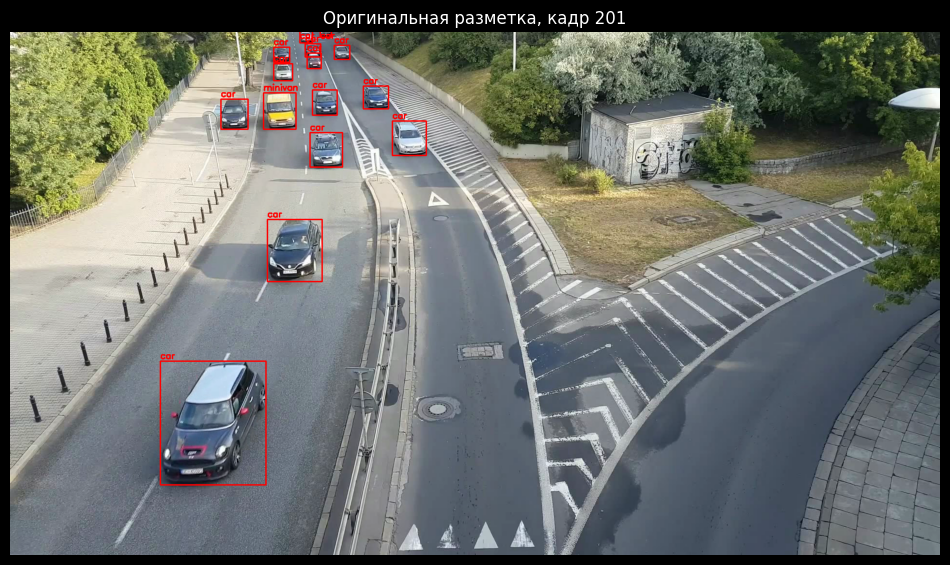

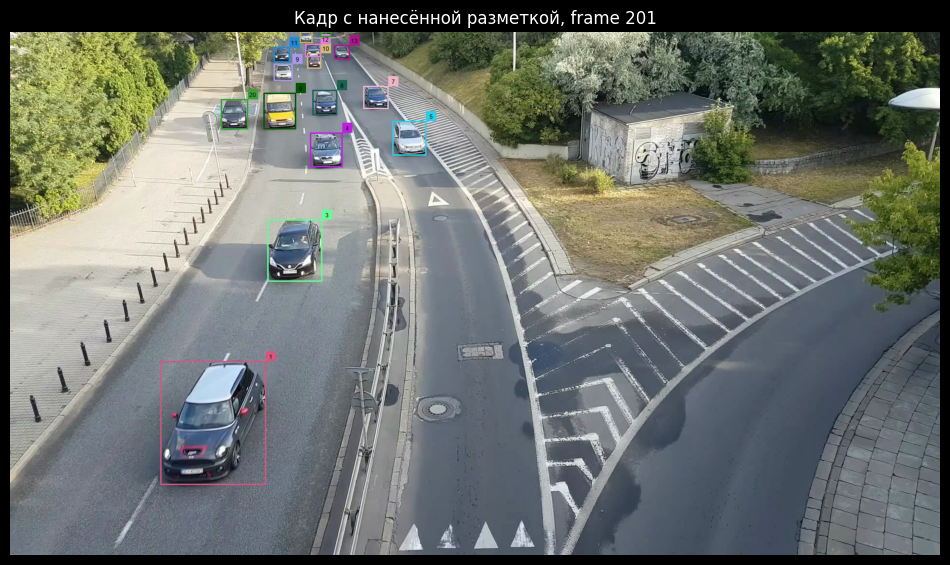

In [8]:
frame_id = 201

img = cv2.imread(str(input_frames[frame_id]))
boxes = gt[gt["frame"] == frame_id]

for _, box in boxes.iterrows():
    x1, y1, x2, y2 = box[["x1", "y1", "x2", "y2"]].astype(int)
    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 2)
    cv2.putText(img, box["label"], (x1, max(15, y1 - 5)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)

plt.figure(figsize=(12, 7))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title(f"Оригинальная разметка, кадр {frame_id}")
plt.show()


img = cv2.imread(str(output_frames[frame_id]))

plt.figure(figsize=(12, 7))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title(f"Кадр с нанесённой разметкой, frame {frame_id}")
plt.show()

## Пробуем разные методы получить bbox-ы

У нас будет 3 подхода: hsv сегментацию, diff и diff с Canny. Параметры подбираются по F1 на одном кадре, затем методы сравниваются на всех кадрах

### Метод 1: HCV

In [9]:
def iou(a, b):
    x1 = max(a[0], b[0])
    y1 = max(a[1], b[1])
    x2 = min(a[2], b[2])
    y2 = min(a[3], b[3])

    inter = max(0, x2 - x1) * max(0, y2 - y1)
    area_a = (a[2] - a[0]) * (a[3] - a[1])
    area_b = (b[2] - b[0]) * (b[3] - b[1])
    union = area_a + area_b - inter

    return inter / union if union > 0 else 0


def hsv_boxes(img, s_min, v_min, min_area, kernel_size):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(hsv, (0, s_min, v_min), (179, 255, 255))

    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    boxes = []
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        if w * h >= min_area:
            boxes.append([x, y, x + w, y + h])

    return boxes


def evaluate_boxes(pred_boxes, true_boxes, iou_thr=0.5):
    matched = set()
    matched_ious = []
    tp = 0

    for pred in pred_boxes:
        ious = [iou(pred, true) for true in true_boxes]

        if len(ious) == 0:
            continue

        best_i = int(np.argmax(ious))
        best_iou = ious[best_i]

        if best_iou >= iou_thr and best_i not in matched:
            tp += 1
            matched.add(best_i)
            matched_ious.append(best_iou)

    fp = len(pred_boxes) - tp
    fn = len(true_boxes) - tp

    precision = tp / (tp + fp) if tp + fp else 0
    recall = tp / (tp + fn) if tp + fn else 0
    f1 = 2 * precision * recall / (precision + recall) if precision + recall else 0
    mean_iou = np.mean(matched_ious) if matched_ious else 0

    return tp, fp, fn, precision, recall, f1, mean_iou

In [10]:
frame_id = 201

img = cv2.imread(str(output_frames[frame_id]))
true_boxes = gt[gt["frame"] == frame_id][["x1", "y1", "x2", "y2"]].values.tolist()

results = []

for s_min in [60, 80, 100, 120, 140, 160, 180, 200]:
    for v_min in [30, 50, 70, 90, 110, 130]:
        for min_area in [100, 300, 700, 1200, 1800, 2500, 3500]:
            for kernel_size in [1, 3, 5, 7]:
                pred_boxes = hsv_boxes(img, s_min, v_min, min_area, kernel_size)
                _, _, _, precision, recall, f1, _ = evaluate_boxes(pred_boxes, true_boxes)

                results.append({
                    "s_min": s_min,
                    "v_min": v_min,
                    "min_area": min_area,
                    "kernel_size": kernel_size,
                    "pred_count": len(pred_boxes),
                    "precision": precision,
                    "recall": recall,
                    "f1": f1,
                })

hsv_results = pd.DataFrame(results).sort_values("f1", ascending=False)
hsv_results.head(10)

,s_min,v_min,min_area,kernel_size,pred_count,precision,recall,f1
523,120,30,1800,7,15,0.533333,0.533333,0.533333
752,140,70,3500,1,9,0.666667,0.400000,0.500000
361,100,30,3500,3,13,0.538462,0.466667,0.500000
351,100,30,1200,7,18,0.444444,0.533333,0.484848
355,100,30,1800,7,18,0.444444,0.533333,0.484848
383,100,50,1800,7,18,0.444444,0.533333,0.484848
363,100,30,3500,7,14,0.500000,0.466667,0.482759
359,100,30,2500,7,14,0.500000,0.466667,0.482759
527,120,30,2500,7,14,0.500000,0.466667,0.482759
531,120,30,3500,7,14,0.500000,0.466667,0.482759


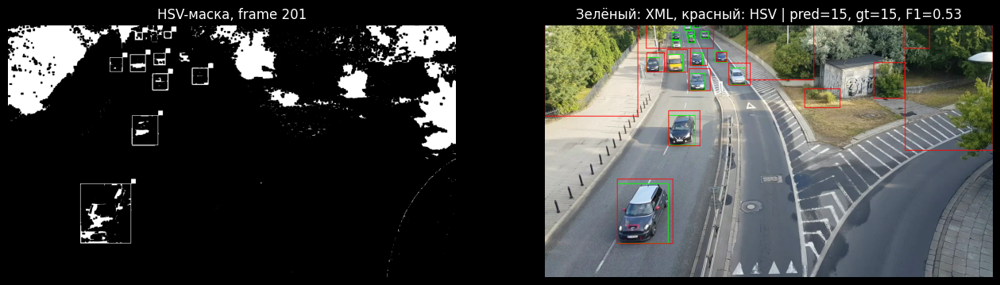

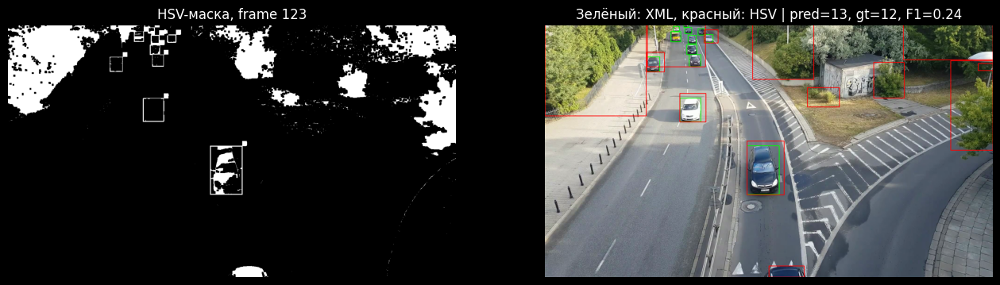

In [11]:
test_frames = [201, 123]
best = hsv_results.iloc[0]

for frame_id in test_frames:
    output_img = cv2.imread(str(output_frames[frame_id]))
    input_img = cv2.imread(str(input_frames[frame_id]))

    hsv = cv2.cvtColor(output_img, cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(
        hsv,
        (0, int(best["s_min"]), int(best["v_min"])),
        (179, 255, 255)
    )

    kernel = np.ones((int(best["kernel_size"]), int(best["kernel_size"])), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    pred_boxes = hsv_boxes(
        output_img,
        int(best["s_min"]),
        int(best["v_min"]),
        int(best["min_area"]),
        int(best["kernel_size"])
    )

    true_boxes = gt[gt["frame"] == frame_id][["x1", "y1", "x2", "y2"]].values.tolist()
    _, _, _, precision, recall, f1, _ = evaluate_boxes(pred_boxes, true_boxes)

    vis = input_img.copy()

    for x1, y1, x2, y2 in true_boxes:
        cv2.rectangle(vis, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)

    for x1, y1, x2, y2 in pred_boxes:
        cv2.rectangle(vis, (x1, y1), (x2, y2), (0, 0, 255), 2)

    plt.figure(figsize=(16, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(mask, cmap="gray")
    plt.axis("off")
    plt.title(f"HSV-маска, frame {frame_id}")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(
        f"Зелёный: XML, красный: HSV | "
        f"pred={len(pred_boxes)}, gt={len(true_boxes)}, F1={f1:.2f}"
    )

    plt.show()

### Метод 2: diff

In [12]:
def diff_boxes(input_img, output_img, threshold, min_area, kernel_size):
    g1 = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY)
    g2 = cv2.cvtColor(output_img, cv2.COLOR_BGR2GRAY)

    diff = cv2.absdiff(g1, g2)
    _, mask = cv2.threshold(diff, threshold, 255, cv2.THRESH_BINARY)

    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    boxes = []

    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)

        if w * h >= min_area:
            boxes.append([x, y, x + w, y + h])

    return boxes, mask

In [13]:
frame_id = 201

input_img = cv2.imread(str(input_frames[frame_id]))
output_img = cv2.imread(str(output_frames[frame_id]))
true_boxes = gt[gt["frame"] == frame_id][["x1", "y1", "x2", "y2"]].values.tolist()

results = []

for threshold in [5, 10, 15, 20, 25, 30, 35, 40]:
    for min_area in [50, 100, 300, 500, 700, 1000, 1200, 1800, 2500]:
        for kernel_size in [1, 3, 5, 7, 9]:
            pred_boxes, mask = diff_boxes(input_img, output_img, threshold, min_area, kernel_size)
            _, _, _, precision, recall, f1, _ = evaluate_boxes(pred_boxes, true_boxes)

            results.append({
                "threshold": threshold,
                "min_area": min_area,
                "kernel_size": kernel_size,
                "pred_count": len(pred_boxes),
                "precision": precision,
                "recall": recall,
                "f1": f1,
            })

diff_results = pd.DataFrame(results).sort_values("f1", ascending=False)
diff_results.head(10)

,threshold,min_area,kernel_size,pred_count,precision,recall,f1
152,20,500,5,10,0.800000,0.533333,0.640000
157,20,700,5,10,0.800000,0.533333,0.640000
147,20,300,5,12,0.666667,0.533333,0.592593
168,20,1200,7,9,0.777778,0.466667,0.583333
178,20,2500,7,9,0.777778,0.466667,0.583333
177,20,2500,5,9,0.777778,0.466667,0.583333
174,20,1800,9,9,0.777778,0.466667,0.583333
173,20,1800,7,9,0.777778,0.466667,0.583333
172,20,1800,5,9,0.777778,0.466667,0.583333
169,20,1200,9,9,0.777778,0.466667,0.583333


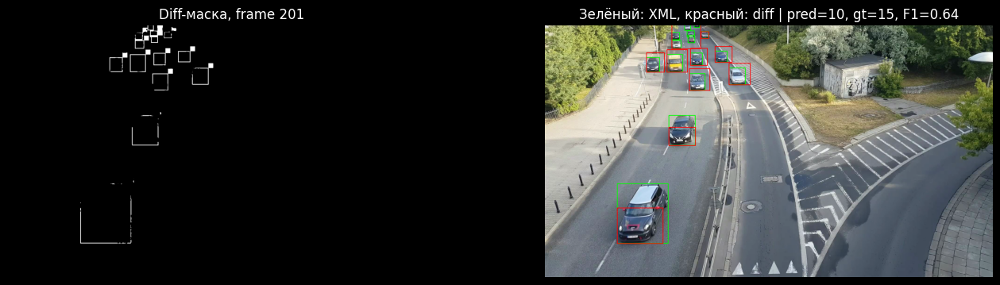

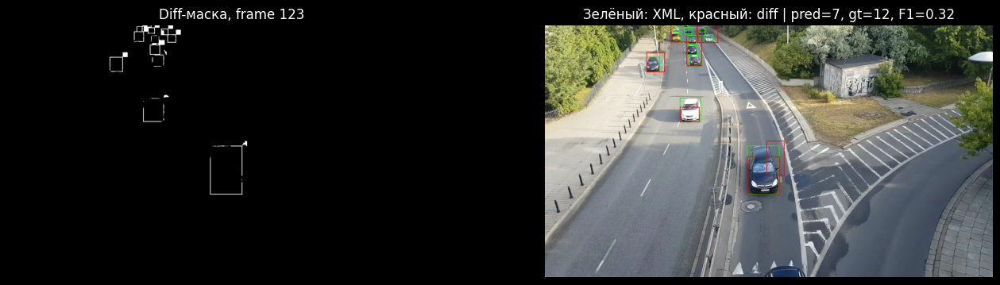

In [14]:
test_frames = [201, 123]
best = diff_results.iloc[0]

for frame_id in test_frames:
    input_img = cv2.imread(str(input_frames[frame_id]))
    output_img = cv2.imread(str(output_frames[frame_id]))

    pred_boxes, mask = diff_boxes(
        input_img,
        output_img,
        int(best["threshold"]),
        int(best["min_area"]),
        int(best["kernel_size"])
    )

    true_boxes = gt[gt["frame"] == frame_id][["x1", "y1", "x2", "y2"]].values.tolist()
    _, _, _, precision, recall, f1, _ = evaluate_boxes(pred_boxes, true_boxes)

    vis = input_img.copy()

    for x1, y1, x2, y2 in true_boxes:
        cv2.rectangle(vis, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)

    for x1, y1, x2, y2 in pred_boxes:
        cv2.rectangle(vis, (x1, y1), (x2, y2), (0, 0, 255), 2)

    plt.figure(figsize=(16, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(mask, cmap="gray")
    plt.axis("off")
    plt.title(f"Diff-маска, frame {frame_id}")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(
        f"Зелёный: XML, красный: diff | "
        f"pred={len(pred_boxes)}, gt={len(true_boxes)}, F1={f1:.2f}"
    )

    plt.show()

### Метод 3: diff + canny

In [15]:
def diff_canny_boxes(input_img, output_img, threshold, canny1, canny2, min_area, kernel_size):
    g1 = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY)
    g2 = cv2.cvtColor(output_img, cv2.COLOR_BGR2GRAY)

    diff = cv2.absdiff(g1, g2)
    _, mask = cv2.threshold(diff, threshold, 255, cv2.THRESH_BINARY)

    edges = cv2.Canny(mask, canny1, canny2)

    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)
    edges = cv2.dilate(edges, kernel, iterations=1)

    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    boxes = []

    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)

        if w * h >= min_area:
            boxes.append([x, y, x + w, y + h])

    return boxes, edges

In [16]:
frame_id = 201

input_img = cv2.imread(str(input_frames[frame_id]))
output_img = cv2.imread(str(output_frames[frame_id]))
true_boxes = gt[gt["frame"] == frame_id][["x1", "y1", "x2", "y2"]].values.tolist()

results = []

for threshold in [5, 10, 15, 20, 25, 30, 35]:
    for canny1 in [20, 30, 50, 70, 90]:
        for canny2 in [80, 100, 150, 200, 250]:
            for min_area in [50, 100, 300, 500, 700, 1000, 1200, 1800]:
                for kernel_size in [1, 3, 5, 7]:
                    pred_boxes, mask = diff_canny_boxes(
                        input_img,
                        output_img,
                        threshold,
                        canny1,
                        canny2,
                        min_area,
                        kernel_size
                    )

                    _, _, _, precision, recall, f1, _ = evaluate_boxes(pred_boxes, true_boxes)

                    results.append({
                        "threshold": threshold,
                        "canny1": canny1,
                        "canny2": canny2,
                        "min_area": min_area,
                        "kernel_size": kernel_size,
                        "pred_count": len(pred_boxes),
                        "precision": precision,
                        "recall": recall,
                        "f1": f1,
                    })

canny_results = pd.DataFrame(results).sort_values("f1", ascending=False)
canny_results.head(10)

,threshold,canny1,canny2,min_area,kernel_size,pred_count,precision,recall,f1
2028,15,50,200,500,1,26,0.461538,0.8,0.585366
2124,15,70,100,500,1,26,0.461538,0.8,0.585366
1932,15,50,80,500,1,26,0.461538,0.8,0.585366
1964,15,50,100,500,1,26,0.461538,0.8,0.585366
2092,15,70,80,500,1,26,0.461538,0.8,0.585366
2252,15,90,80,500,1,26,0.461538,0.8,0.585366
1676,15,20,150,500,1,26,0.461538,0.8,0.585366
2188,15,70,200,500,1,26,0.461538,0.8,0.585366
1644,15,20,100,500,1,26,0.461538,0.8,0.585366
2284,15,90,100,500,1,26,0.461538,0.8,0.585366


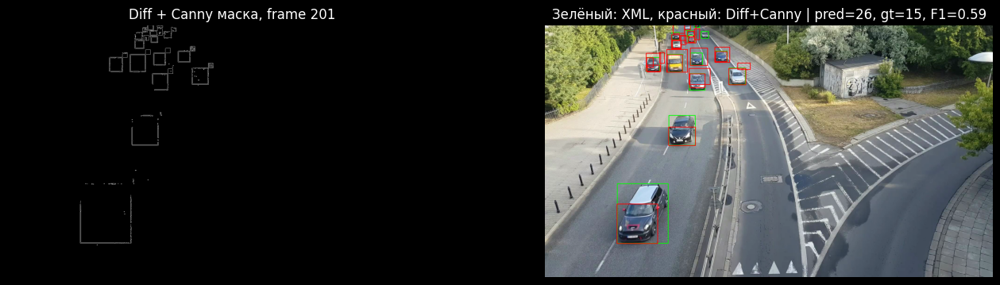

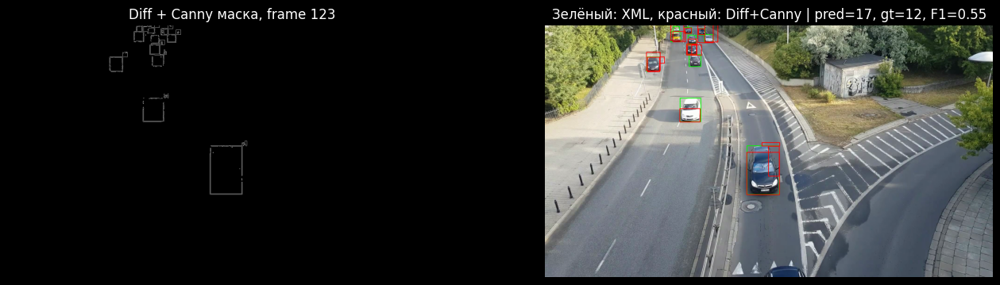

In [17]:
test_frames = [201, 123]
best = canny_results.iloc[0]

for frame_id in test_frames:
    input_img = cv2.imread(str(input_frames[frame_id]))
    output_img = cv2.imread(str(output_frames[frame_id]))

    pred_boxes, mask = diff_canny_boxes(
        input_img,
        output_img,
        int(best["threshold"]),
        int(best["canny1"]),
        int(best["canny2"]),
        int(best["min_area"]),
        int(best["kernel_size"])
    )

    true_boxes = gt[gt["frame"] == frame_id][["x1", "y1", "x2", "y2"]].values.tolist()
    _, _, _, precision, recall, f1, _ = evaluate_boxes(pred_boxes, true_boxes)

    vis = input_img.copy()

    for x1, y1, x2, y2 in true_boxes:
        cv2.rectangle(vis, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)

    for x1, y1, x2, y2 in pred_boxes:
        cv2.rectangle(vis, (x1, y1), (x2, y2), (0, 0, 255), 2)

    plt.figure(figsize=(16, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(mask, cmap="gray")
    plt.axis("off")
    plt.title(f"Diff + Canny маска, frame {frame_id}")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(
        f"Зелёный: XML, красный: Diff+Canny | "
        f"pred={len(pred_boxes)}, gt={len(true_boxes)}, F1={f1:.2f}"
    )

    plt.show()

## Сравнение 3 методов

In [18]:
hsv_best = hsv_results.iloc[0]
diff_best = diff_results.iloc[0]
canny_best = canny_results.iloc[0]

def run_method(method, input_img, output_img):
    if method == "HSV":
        return hsv_boxes(
            output_img,
            int(hsv_best["s_min"]),
            int(hsv_best["v_min"]),
            int(hsv_best["min_area"]),
            int(hsv_best["kernel_size"])
        )

    if method == "Diff":
        return diff_boxes(
            input_img,
            output_img,
            int(diff_best["threshold"]),
            int(diff_best["min_area"]),
            int(diff_best["kernel_size"])
        )[0]

    return diff_canny_boxes(
        input_img,
        output_img,
        int(canny_best["threshold"]),
        int(canny_best["canny1"]),
        int(canny_best["canny2"]),
        int(canny_best["min_area"]),
        int(canny_best["kernel_size"])
    )[0]


rows = []

for frame_id in sorted(gt["frame"].unique()):
    input_img = cv2.imread(str(input_frames[frame_id]))
    output_img = cv2.imread(str(output_frames[frame_id]))
    true_boxes = gt[gt["frame"] == frame_id][["x1", "y1", "x2", "y2"]].values.tolist()

    for method in ["HSV", "Diff", "Diff + Canny"]:
        pred_boxes = run_method(method, input_img, output_img)
        tp, fp, fn, precision, recall, f1, mean_iou = evaluate_boxes(pred_boxes, true_boxes)

        rows.append([
            method,
            frame_id,
            tp,
            fp,
            fn,
            precision,
            recall,
            f1,
            mean_iou,
            len(pred_boxes),
            len(true_boxes)
        ])

method_scores = pd.DataFrame(
    rows,
    columns=[
        "method",
        "frame",
        "tp",
        "fp",
        "fn",
        "precision",
        "recall",
        "f1",
        "mean_iou",
        "pred_count",
        "gt_count"
    ]
)

method_summary = (
    method_scores
    .groupby("method")
    .agg({
        "mean_iou": "mean",
        "tp": "sum",
        "fp": "sum",
        "fn": "sum",
        "precision": "mean",
        "recall": "mean",
        "f1": "mean",
        "pred_count": "mean",
        "gt_count": "mean"
    })
    .sort_values("f1", ascending=False)
)

method_summary

,mean_iou,tp,fp,fn,precision,recall,f1,pred_count,gt_count
method,,,,,,,,,
Diff,0.675942,1822,1301,1825,0.591908,0.518492,0.545439,10.375415,12.116279
Diff + Canny,0.782442,2686,4604,961,0.372745,0.745652,0.494429,24.219269,12.116279
HSV,0.671877,1493,3580,2154,0.295792,0.422542,0.343858,16.853821,12.116279


Победитель - diff. Поэтому дальше COCO разметка строится именно по bbox, извлечённым этим методом

Сравнение лучшего метода с эталоном, где эталон - зеленый, а наш метод - красный

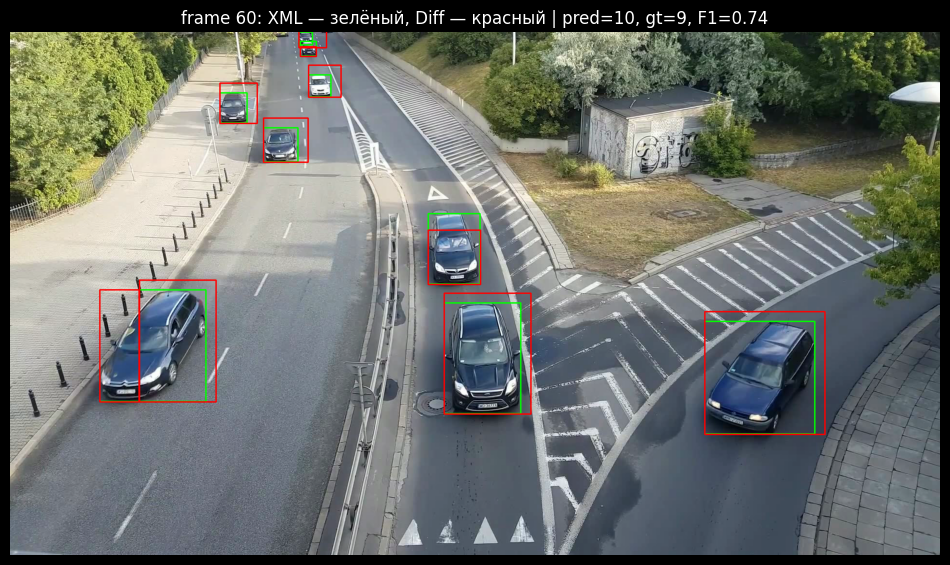

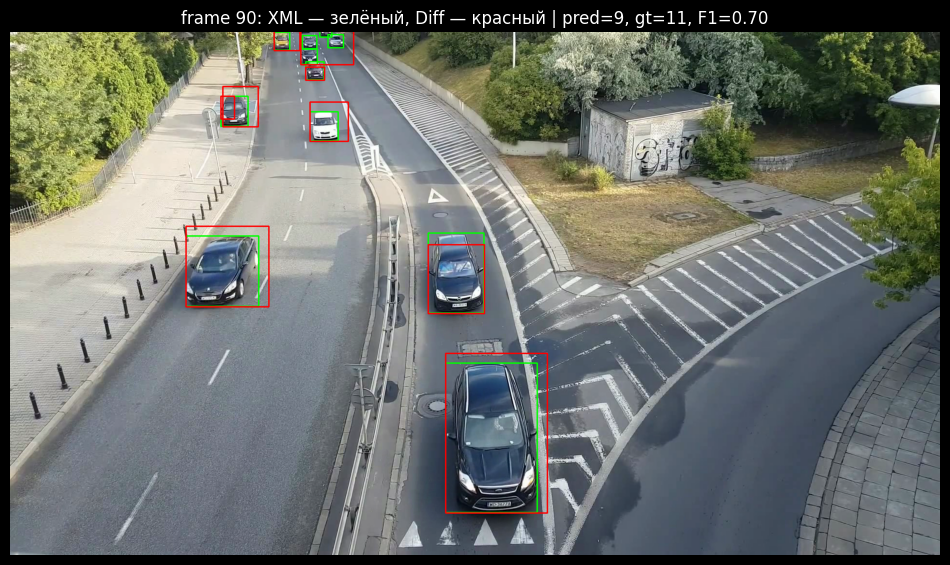

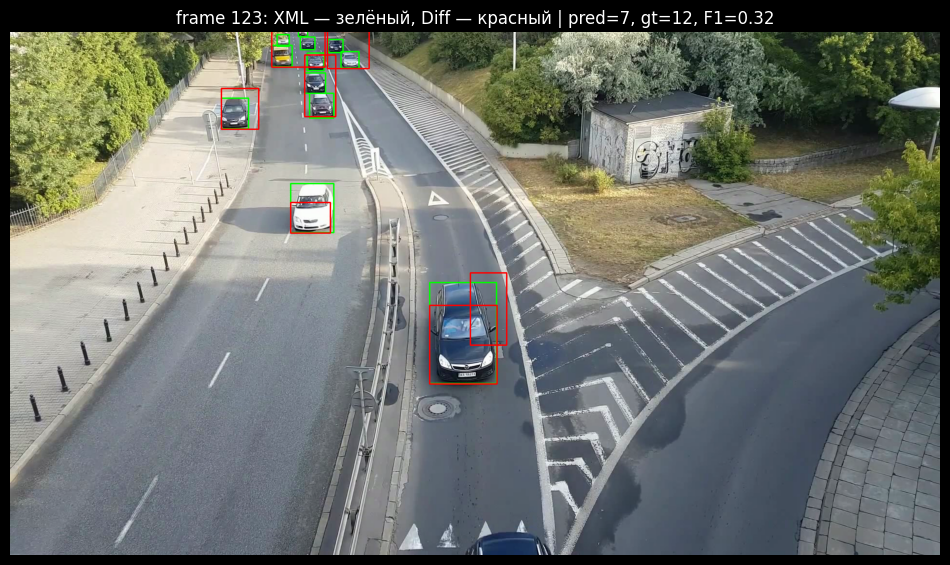

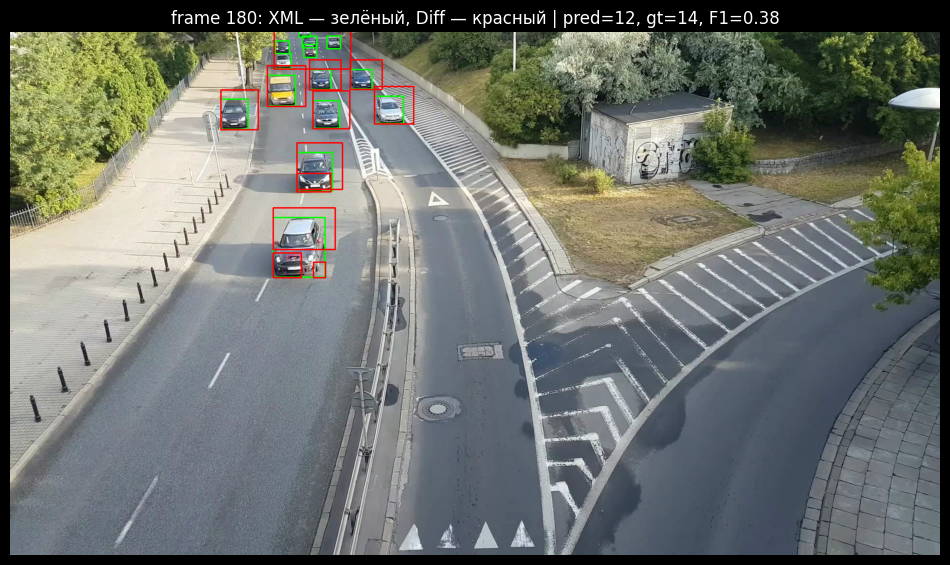

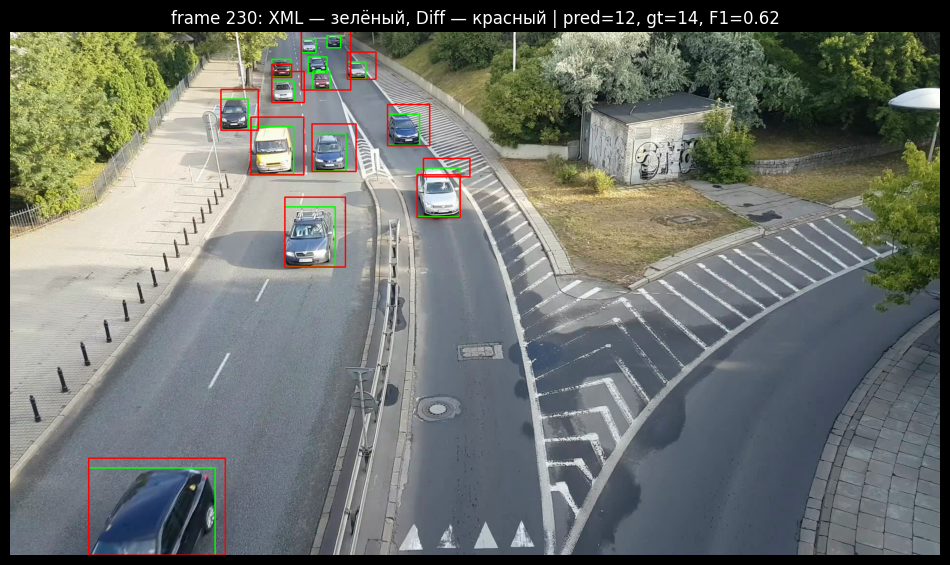

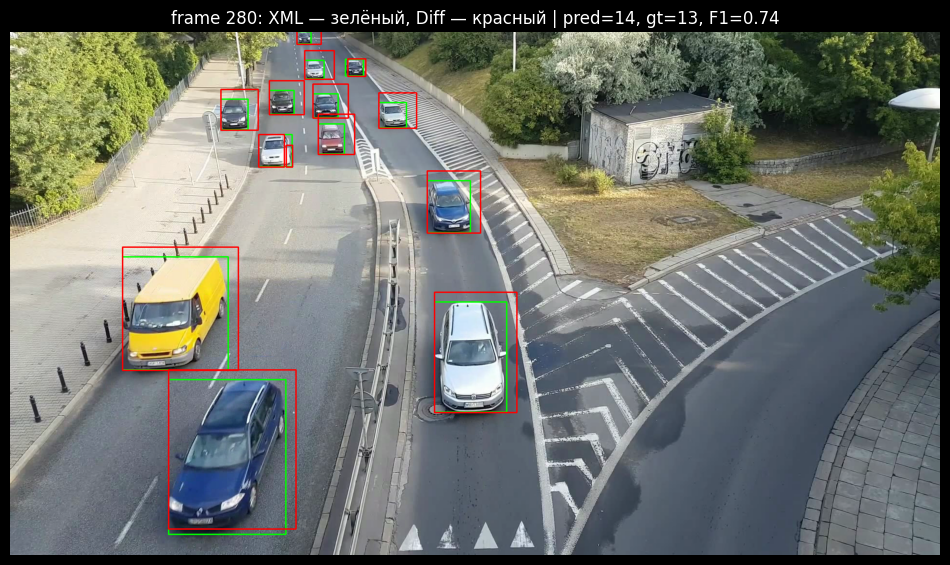

In [19]:
diff_best = diff_results.iloc[0]
test_frames = [60, 90, 123, 180, 230, 280]


for frame_id in test_frames:
    input_img = cv2.imread(str(input_frames[frame_id]))
    output_img = cv2.imread(str(output_frames[frame_id]))

    pred_boxes, _ = diff_boxes(
        input_img,
        output_img,
        int(diff_best["threshold"]),
        int(diff_best["min_area"]),
        int(diff_best["kernel_size"])
    )

    true_boxes = gt[gt["frame"] == frame_id][["x1", "y1", "x2", "y2"]].values.tolist()
    _, _, _, precision, recall, f1, _ = evaluate_boxes(pred_boxes, true_boxes)

    vis = input_img.copy()

    for x1, y1, x2, y2 in true_boxes:
        cv2.rectangle(vis, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)

    for x1, y1, x2, y2 in pred_boxes:
        cv2.rectangle(vis, (int(x1), int(y1)), (int(x2), int(y2)), (0, 0, 255), 2)

    plt.figure(figsize=(12, 7))
    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(
        f"frame {frame_id}: XML — зелёный, Diff — красный | "
        f"pred={len(pred_boxes)}, gt={len(true_boxes)}, F1={f1:.2f}"
    )
    plt.show()

## COCO

Извлечённые bbox переводим в стандартный COCO формат. Используется один класс `vehicle`, тк из визуальной разметки надёжно восстанавливаются координаты, но не исходные классы `car` и `minivan`

In [20]:
diff_best = diff_results.iloc[0]

rows = []

for frame_id in range(len(input_frames)):
    input_img = cv2.imread(str(input_frames[frame_id]))
    output_img = cv2.imread(str(output_frames[frame_id]))

    pred_boxes, _ = diff_boxes(
        input_img,
        output_img,
        int(diff_best["threshold"]),
        int(diff_best["min_area"]),
        int(diff_best["kernel_size"])
    )

    for x1, y1, x2, y2 in pred_boxes:
        w = x2 - x1
        h = y2 - y1

        if w <= 0 or h <= 0:
            continue

        rows.append({
            "frame": frame_id,
            "label": "vehicle",
            "x1": x1,
            "y1": y1,
            "x2": x2,
            "y2": y2,
            "w": w,
            "h": h,
            "area": w * h,
        })

extracted_boxes = pd.DataFrame(rows)

extracted_boxes.head()

,frame,label,x1,y1,x2,y2,w,h,area
0,0,vehicle,884,411,1040,604,156,193,30108
1,0,vehicle,336,392,497,544,161,152,24472
2,0,vehicle,841,291,944,405,103,114,11742
3,0,vehicle,601,199,700,307,99,108,10692
4,0,vehicle,428,96,510,180,82,84,6888


In [21]:
Path("annotations").mkdir(exist_ok=True)

coco = {
    "images": [],
    "annotations": [],
    "categories": [
        {"id": 1, "name": "vehicle"}
    ]
}

ann_id = 1

for frame_id, path in enumerate(input_frames):
    img = cv2.imread(str(path))
    height, width = img.shape[:2]

    coco["images"].append({
        "id": frame_id,
        "file_name": str(path),
        "width": width,
        "height": height
    })

    boxes = extracted_boxes[extracted_boxes["frame"] == frame_id]

    for _, box in boxes.iterrows():
        coco["annotations"].append({
            "id": ann_id,
            "image_id": int(frame_id),
            "category_id": 1,
            "bbox": [
                float(box["x1"]),
                float(box["y1"]),
                float(box["w"]),
                float(box["h"])
            ],
            "area": float(box["area"]),
            "iscrowd": 0
        })

        ann_id += 1

with open("annotations/coco_extracted.json", "w") as f:
    json.dump(coco, f)

len(coco["images"]), len(coco["annotations"])

(301, 3123)

## Train/Val/Test и обучение

Делим кадры на train, validation и test. Validation используется для контроля переобучения и выбора лучшей эпохи, test остаётся только для финальной оценки

In [22]:
image_ids = [img["id"] for img in coco["images"]]

rng = np.random.default_rng(42)
rng.shuffle(image_ids)

n = len(image_ids)
train_ids = image_ids[:int(0.7 * n)]
val_ids = image_ids[int(0.7 * n):int(0.85 * n)]
test_ids = image_ids[int(0.85 * n):]

Для обучения выбрана `fasterrcnn_mobilenet_v3_large_320_fpn`. Это облегчённая Faster R-CNN с FPN, которая быстрее полной версии и подходит для локального обучения

In [23]:
device = "cpu"

model = fasterrcnn_mobilenet_v3_large_320_fpn(weights="DEFAULT")

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, 2)

model.to(device)

device

'cpu'

In [24]:
class DetectionDataset(Dataset):
    def __init__(self, coco, image_ids, max_side=640):
        self.image_ids = image_ids
        self.max_side = max_side
        self.images = {img["id"]: img for img in coco["images"]}

        self.annotations = {}
        for ann in coco["annotations"]:
            self.annotations.setdefault(ann["image_id"], []).append(ann)

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        image_info = self.images[image_id]

        image = cv2.imread(image_info["file_name"])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        boxes = []
        labels = []

        for ann in self.annotations.get(image_id, []):
            x, y, w, h = ann["bbox"]

            if w > 1 and h > 1:
                boxes.append([x, y, x + w, y + h])
                labels.append(ann["category_id"])

        boxes = torch.tensor(boxes, dtype=torch.float32).reshape(-1, 4)
        labels = torch.tensor(labels, dtype=torch.int64)

        h, w = image.shape[:2]
        scale = min(self.max_side / max(h, w), 1.0)

        if scale < 1.0:
            image = cv2.resize(
                image,
                (int(w * scale), int(h * scale)),
                interpolation=cv2.INTER_AREA
            )
            boxes *= scale

        image = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0
        area = (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1])

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": torch.tensor([image_id]),
            "area": area,
            "iscrowd": torch.zeros((len(boxes),), dtype=torch.int64),
        }

        return image, target


def collate_fn(batch):
    return tuple(zip(*batch))


train_dataset = DetectionDataset(coco, train_ids, max_side=640)
val_dataset = DetectionDataset(coco, val_ids, max_side=640)
test_dataset = DetectionDataset(coco, test_ids, max_side=640)

train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=2, shuffle=False, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=2, shuffle=False, collate_fn=collate_fn)

len(train_dataset), len(val_dataset), len(test_dataset)

(210, 45, 46)

Маповые метрики

In [25]:
def get_map(model, loader):
    model.eval()
    metric = MeanAveragePrecision(box_format="xyxy")

    with torch.no_grad():
        for images, targets in loader:
            images = [img.to(device) for img in images]
            preds = model(images)

            preds = [
                {
                    "boxes": p["boxes"].cpu(),
                    "scores": p["scores"].cpu(),
                    "labels": p["labels"].cpu()
                }
                for p in preds
            ]

            targets = [
                {
                    "boxes": t["boxes"].cpu(),
                    "labels": t["labels"].cpu()
                }
                for t in targets
            ]

            metric.update(preds, targets)

    scores = metric.compute()

    return float(scores["map"]), float(scores["map_50"])

Наконец то обучение

In [26]:
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)

epochs = 8
patience = 3
best_map = 0
bad_epochs = 0
history = []

for epoch in range(epochs):
    model.train()
    train_loss = 0

    for images, targets in train_loader:
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        losses = model(images, targets)
        loss = sum(losses.values())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    train_loss /= len(train_loader)
    val_map, val_map_50 = get_map(model, val_loader)

    history.append([epoch + 1, train_loss, val_map, val_map_50])

    print(
        f"epoch {epoch + 1}: "
        f"loss={train_loss:.4f}, "
        f"val_map={val_map:.4f}, "
        f"val_map_50={val_map_50:.4f}"
    )

    if val_map > best_map:
        best_map = val_map
        bad_epochs = 0
        torch.save(model.state_dict(), "best_detector.pth")
    else:
        bad_epochs += 1

    if bad_epochs == patience:
        print("early stopping")
        break

history = pd.DataFrame(history, columns=["epoch", "train_loss", "val_map", "val_map_50"])
history

epoch 1: loss=1.0419, val_map=0.3333, val_map_50=0.6314
epoch 2: loss=1.0255, val_map=0.4083, val_map_50=0.6860
epoch 3: loss=1.0264, val_map=0.4579, val_map_50=0.7364
epoch 4: loss=1.0323, val_map=0.4437, val_map_50=0.7501
epoch 5: loss=1.0215, val_map=0.4909, val_map_50=0.7680
epoch 6: loss=1.0208, val_map=0.4846, val_map_50=0.7742
epoch 7: loss=1.0026, val_map=0.5106, val_map_50=0.7808
epoch 8: loss=1.0265, val_map=0.5205, val_map_50=0.7962


,epoch,train_loss,val_map,val_map_50
0,1,1.041942,0.333313,0.631450
1,2,1.025504,0.408314,0.685988
2,3,1.026357,0.457876,0.736426
3,4,1.032310,0.443659,0.750122
4,5,1.021536,0.490938,0.768002
5,6,1.020765,0.484597,0.774181
6,7,1.002609,0.510585,0.780822
7,8,1.026489,0.520489,0.796204


## Оценка модели

Построим графики train loss и val mAPы

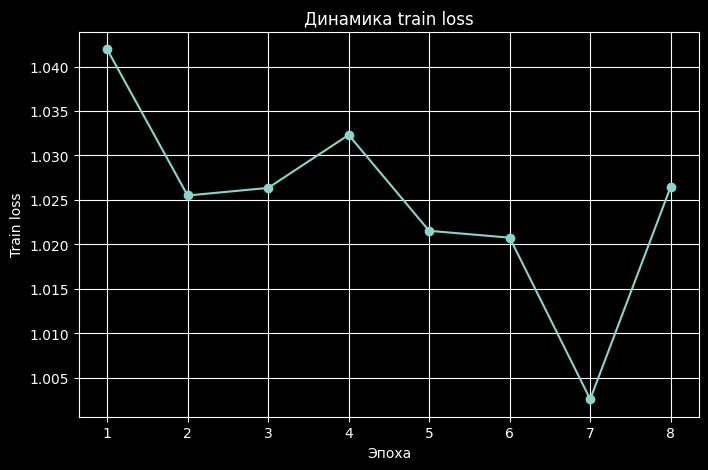

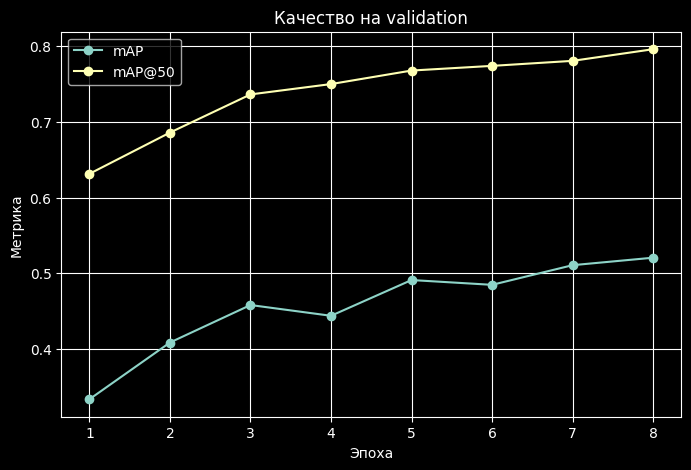

In [27]:
plt.figure(figsize=(8, 5))
plt.plot(history["epoch"], history["train_loss"], marker="o")
plt.xlabel("Эпоха")
plt.ylabel("Train loss")
plt.title("Динамика train loss")
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(history["epoch"], history["val_map"], marker="o", label="mAP")
plt.plot(history["epoch"], history["val_map_50"], marker="o", label="mAP@50")
plt.xlabel("Эпоха")
plt.ylabel("Метрика")
plt.title("Качество на validation")
plt.legend()
plt.grid(True)
plt.show()

Рост val метрик показывает, что модель улучшает качество на отложенных кадрах, а не только подстраивается под train

Test метрики считаются на отложенной выборке, которая не участвовала в обучении и выборе лучшей эпохи

In [28]:
model.load_state_dict(torch.load("best_detector.pth", map_location=device))
model.to(device)
model.eval()

test_map, test_map_50 = get_map(model, test_loader)

pd.DataFrame([{
    "test_map": test_map,
    "test_map_50": test_map_50
}])

,test_map,test_map_50
0,0.495464,0.782928


Демонстрация на случайных кадрах из test. Слева target из COCO, справа предсказания модели

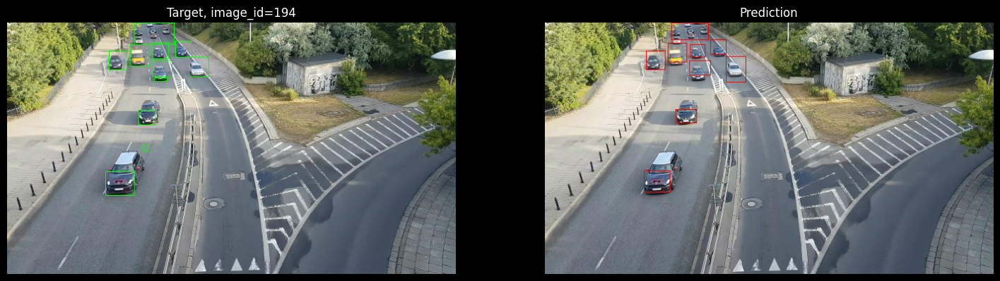

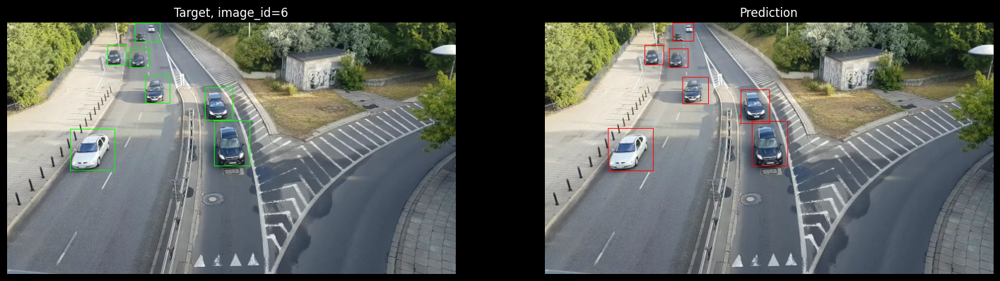

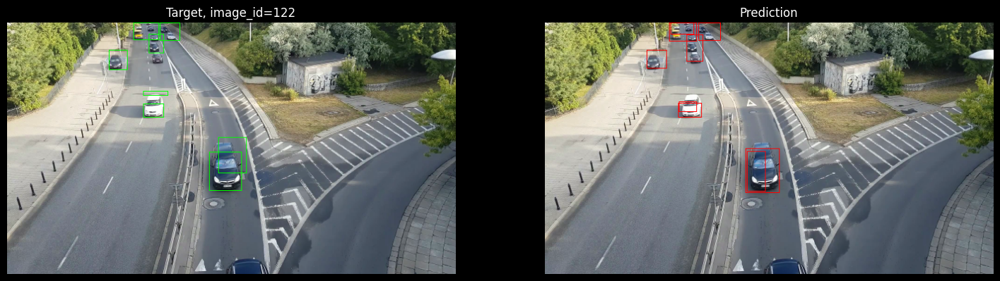

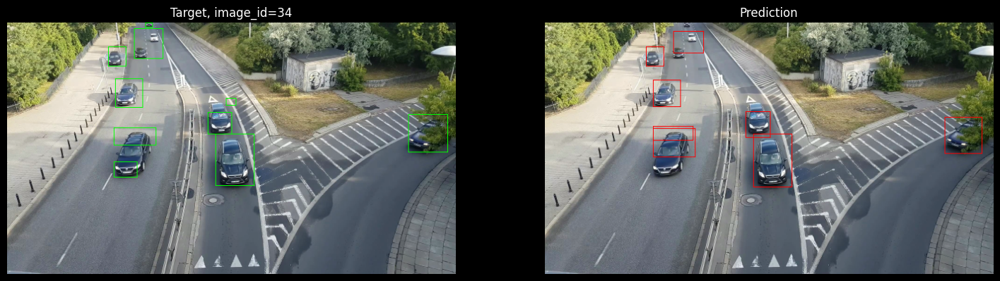

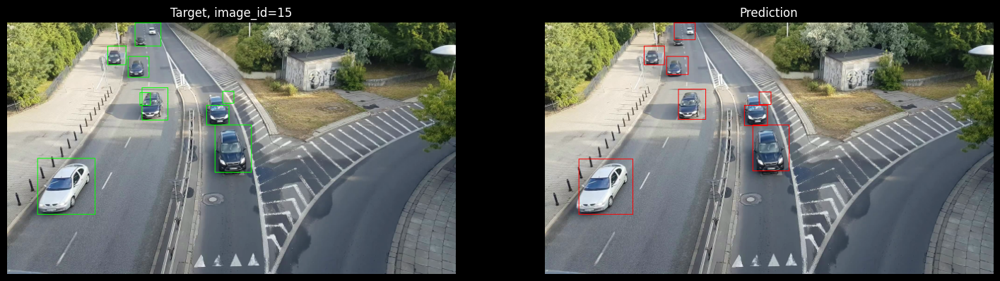

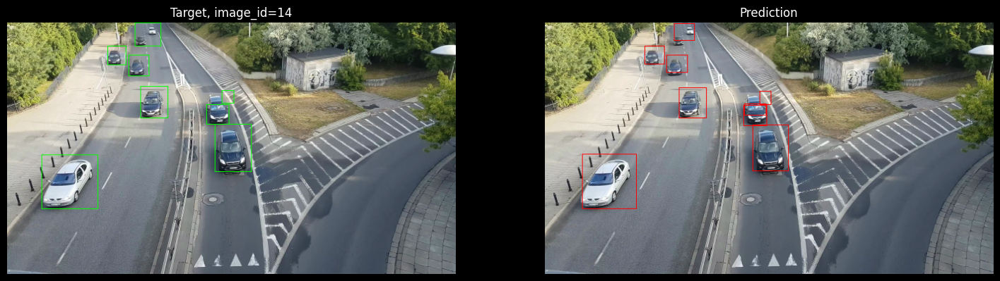

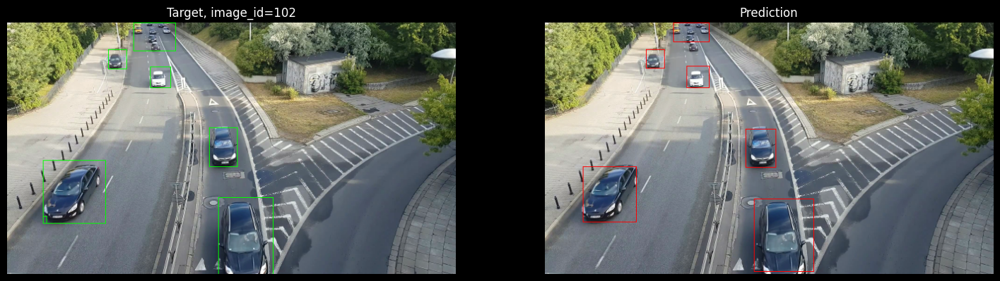

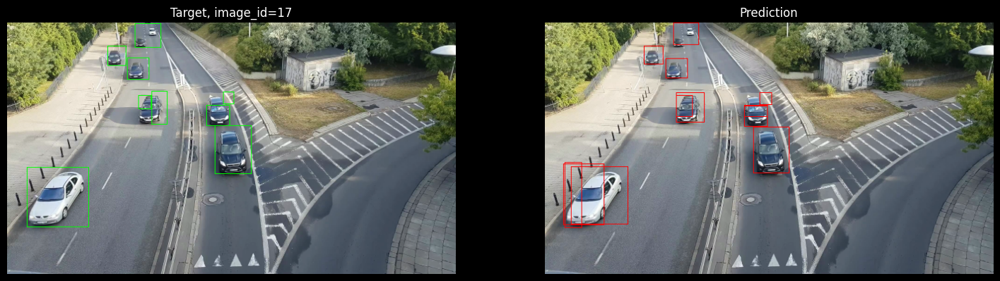

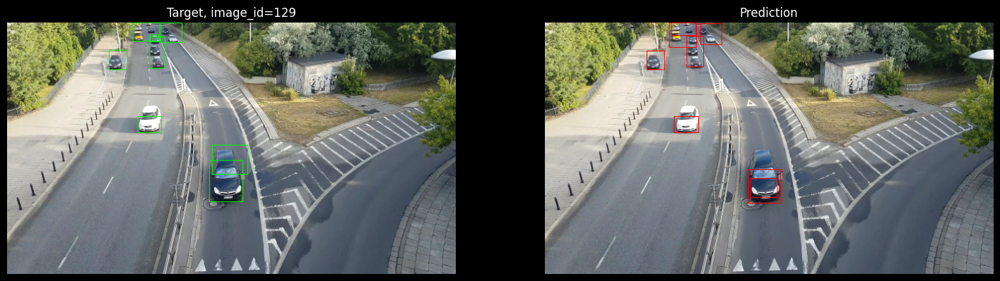

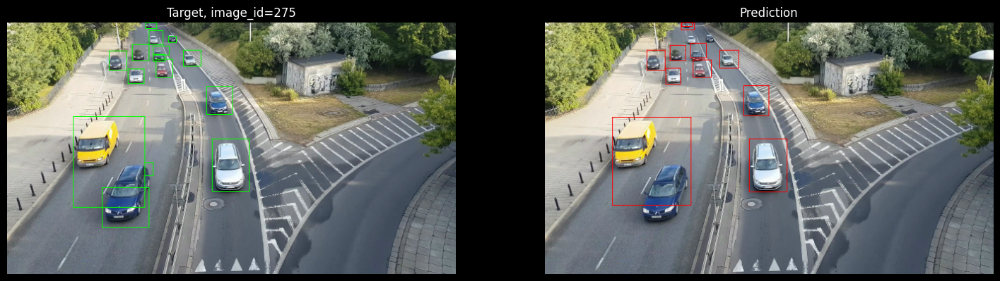

In [36]:
model.load_state_dict(torch.load("best_detector.pth", map_location=device))
model.to(device)
model.eval()

score_thr = 0.6
rng = np.random.default_rng(42)
sample_ids = rng.choice(test_dataset.image_ids, size=10, replace=False)

for image_id in sample_ids:
    idx = test_dataset.image_ids.index(int(image_id))
    image, target = test_dataset[idx]

    with torch.no_grad():
        pred = model([image.to(device)])[0]

    img = (image.permute(1, 2, 0).numpy() * 255).astype(np.uint8)

    target_vis = img.copy()
    pred_vis = img.copy()

    for box in target["boxes"]:
        x1, y1, x2, y2 = box.int().tolist()
        cv2.rectangle(target_vis, (x1, y1), (x2, y2), (0, 255, 0), 1)

    for box, score in zip(pred["boxes"].cpu(), pred["scores"].cpu()):
        if score < score_thr:
            continue

        x1, y1, x2, y2 = box.int().tolist()
        cv2.rectangle(pred_vis, (x1, y1), (x2, y2), (255, 0, 0), 1)

    plt.figure(figsize=(18, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(target_vis)
    plt.axis("off")
    plt.title(f"Target, image_id={image_id}")

    plt.subplot(1, 2, 2)
    plt.imshow(pred_vis)
    plt.axis("off")
    plt.title(f"Prediction")

    plt.show()

## Применение модели к видосу

In [37]:
Path("outputs").mkdir(exist_ok=True)

model.load_state_dict(torch.load("best_detector.pth", map_location=device))
model.to(device)
model.eval()

score_thr = 0.8
max_side = test_dataset.max_side

cap = cv2.VideoCapture(str(input_video_path))

fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

out = cv2.VideoWriter(
    "outputs/new_output.mp4",
    cv2.VideoWriter_fourcc(*"mp4v"),
    fps,
    (width, height)
)

frame_id = 0

while True:
    ok, frame = cap.read()

    if not ok:
        break

    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    h, w = rgb.shape[:2]
    scale = min(max_side / max(h, w), 1.0)

    if scale < 1.0:
        resized = cv2.resize(
            rgb,
            (int(w * scale), int(h * scale)),
            interpolation=cv2.INTER_AREA
        )
    else:
        resized = rgb.copy()

    image = torch.from_numpy(resized).permute(2, 0, 1).float() / 255.0

    with torch.no_grad():
        pred = model([image.to(device)])[0]

    for box, score in zip(pred["boxes"].cpu(), pred["scores"].cpu()):
        if score < score_thr:
            continue

        x1, y1, x2, y2 = box.numpy()

        x1 = int(x1 / scale)
        y1 = int(y1 / scale)
        x2 = int(x2 / scale)
        y2 = int(y2 / scale)

        cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 0, 255), 2)

    out.write(frame)

    frame_id += 1

cap.release()
out.release()

"outputs/new_output.mp4"

'outputs/new_output.mp4'

## Итоги

Сначала видео были разложены на кадры, затем я попробовал несколько способов восстановить bbox.

Самым капризным местом оказалась не модель, а сама извлечённая разметка. На крупных одиночных машинах метод работает достаточно уверенно, но на дальних объектах bbox могут склеиваться, дробиться или пропадать. Поэтому сравнение с оригинальной CVAT xml разметкой было важным этапом.

После этого извлечённая разметка была сохранена в COCO формате. На этом датасете была дообучена `fasterrcnn_mobilenet_v3_large_320_fpn`.

Для контроля переобучения использовались val mAP, сохранение лучшей модели и early stopping.

Главный вывод: задачу можно решить без ручной разметки, но качество всей цепочки сильно зависит от первого этапа извлечения bbox. Если недоразметка шумная, модель не просто учится находить машины, но и частично наследует ошибки этой разметки, что отчетливо было видно в этой работе.